# House Prices: Advanced Regression Techniques

Names:
Doron Ben Zaken,
Ilan Kalantarov

IDs:
208747352,
322815671

Kaggle accounts:
https://www.kaggle.com/doronbenzaken,
https://www.kaggle.com/ilankalantarov

# About the competition

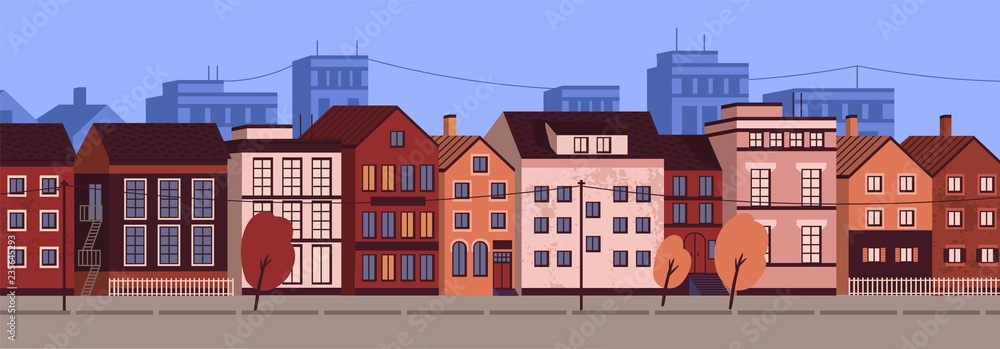

In the competition, we developed a model to predict house prices in Ames, Iowa. We experimented with linear regression using various data splits, feature selection methods, and regularization techniques. Each approach was rigorously evaluated through cross-validation, and the top-performing model was selected for predicting apartment prices in the test dataset.

# Imports & Definitions

In [ ]:
# update plotly, pandas_profiling, sweetviz and autoviz version
!pip install --upgrade plotly
!pip install sweetviz
!pip install autoviz

In [ ]:
# import numpy, matplotlib, etc.
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# sklearn imports
from sklearn import metrics
from sklearn import pipeline
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import model_selection
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import LeavePOut
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures

# Read Data

In [ ]:
train = pd.read_csv("/content/train.csv")
test = pd.read_csv("/content/test.csv")

display(train)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

**Data fields Descriptions**

| Data Field       | Description                                                  |
|------------------|--------------------------------------------------------------|
| SalePrice        | Property's sale price in dollars (target variable).           |
| MSSubClass       | The building class.                                           |
| MSZoning         | General zoning classification of the property.                |
| LotFrontage      | Linear feet of street connected to the property.              |
| LotArea          | Size of the lot in square feet.                               |
| Street           | Type of road access to the property.                          |
| Alley            | Type of alley access to the property.                         |
| LotShape         | General shape of the property.                                |
| LandContour      | Flatness of the property.                                     |
| Utilities        | Type of utilities available.                                  |
| LotConfig        | Lot configuration.                                           |
| LandSlope        | Slope of the property.                                        |
| Neighborhood     | Physical location within Ames city limits.                    |
| Condition1       | Proximity to various conditions (e.g., main road).            |
| Condition2       | Proximity to additional conditions (if applicable).           |
| BldgType         | Type of dwelling.                                            |
| HouseStyle       | Style of dwelling.                                           |
| OverallQual      | Rating of overall material and finish of the house.           |
| OverallCond      | Rating of overall condition of the house.                     |
| YearBuilt        | Original construction year of the house.                      |
| YearRemodAdd     | Year of house remodeling.                                    |
| RoofStyle        | Type of roof.                                                |
| RoofMatl         | Roof material.                                               |
| Exterior1st      | Exterior covering on the house.                               |
| Exterior2nd      | Secondary exterior covering (if applicable).                  |
| MasVnrType       | Type of masonry veneer.                                      |
| MasVnrArea       | Masonry veneer area in square feet.                           |
| ExterQual        | Quality of exterior material.                                 |
| ExterCond        | Current condition of exterior material.                       |
| Foundation       | Type of foundation.                                          |
| BsmtQual         | Height of the basement.                                      |
| BsmtCond         | General condition of the basement.                            |
| BsmtExposure     | Walkout or garden level basement walls.                       |
| BsmtFinType1     | Quality of basement finished area.                            |
| BsmtFinSF1       | Type 1 finished square feet of basement area.                 |
| BsmtFinType2     | Quality of second finished area (if applicable).              |
| BsmtFinSF2       | Type 2 finished square feet of basement area.                 |
| BsmtUnfSF        | Unfinished square feet of basement area.                      |
| TotalBsmtSF      | Total square feet of basement area.                           |
| Heating          | Type of heating.                                             |
| HeatingQC        | Heating quality and condition.                                |
| CentralAir       | Central air conditioning.                                    |
| Electrical       | Type of electrical system.                                   |
| 1stFlrSF         | First floor square feet.                                      |
| 2ndFlrSF         | Second floor square feet.                                     |
| LowQualFinSF     | Low quality finished square feet (all floors).                |
| GrLivArea        | Above grade (ground) living area square feet.                 |
| BsmtFullBath     | Number of basement full bathrooms.                            |
| BsmtHalfBath     | Number of basement half bathrooms.                            |
| FullBath         | Number of full bathrooms above grade.                         |
| HalfBath         | Number of half bathrooms above grade.                         |
| Bedroom          | Number of bedrooms above basement level.                      |
| Kitchen          | Number of kitchens.                                          |
| KitchenQual      | Kitchen quality.                                             |
| TotRmsAbvGrd     | Total rooms above grade (excluding bathrooms).               |
| Functional       | Home functionality rating.                                   |
| Fireplaces       | Number of fireplaces.                                        |
| FireplaceQu      | Quality of fireplace.                                        |
| GarageType       | Garage location.                                             |
| GarageYrBlt      | Year garage was built.                                       |
| GarageFinish     | Interior finish of the garage.                               |
| GarageCars       | Size of garage in car capacity.                              |
| GarageArea       | Size of garage in square feet.                               |
| GarageQual       | Quality of garage.                                           |
| GarageCond       | Condition of garage.                                         |
| PavedDrive       | Paved driveway.                                              |
| WoodDeckSF       | Wood deck area in square feet.                               |
| OpenPorchSF      | Open porch area in square feet.                              |
| EnclosedPorch    | Enclosed porch area in square feet.                          |
| 3SsnPorch        | Three season porch area in square feet.                      |
| ScreenPorch      | Screen porch area in square feet.                             |
| PoolArea         | Pool area in square feet.                                    |
| PoolQC           | Quality of pool.                                             |
| Fence            | Quality of fence.                                            |
| MiscFeature      | Miscellaneous feature not covered in other categories.       |
| MiscVal          | Monetary value of miscellaneous feature.                      |
| MoSold           | Month sold.                                                  |
| YrSold           | Year sold.                                                   |
| SaleType         | Type of sale.                                                |
| SaleCondition    | Condition of sale.                                           |

In [ ]:
# show train data information
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

                                             |          | [  0%]   00:00 -> (? left)


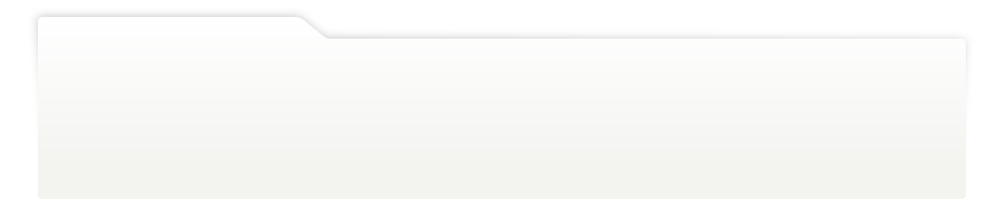
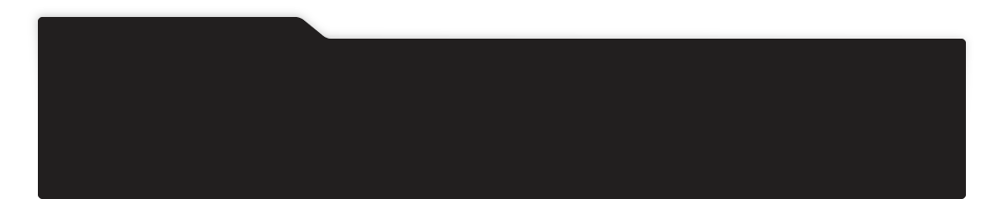
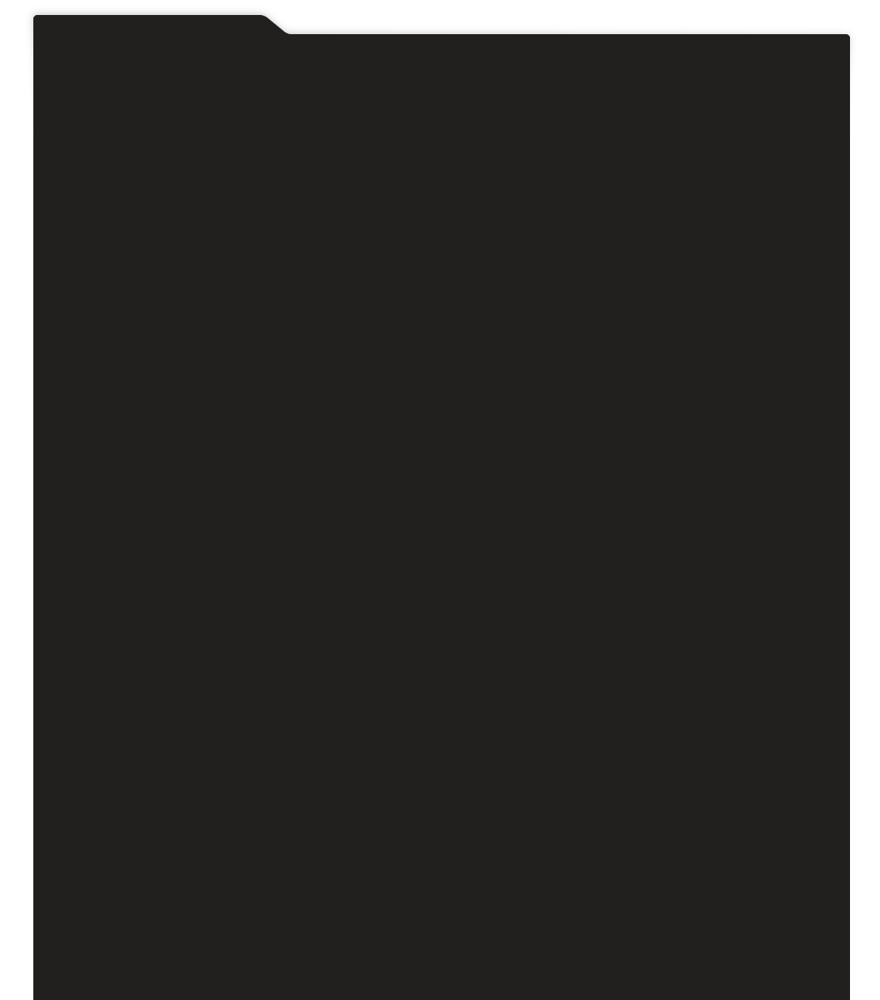
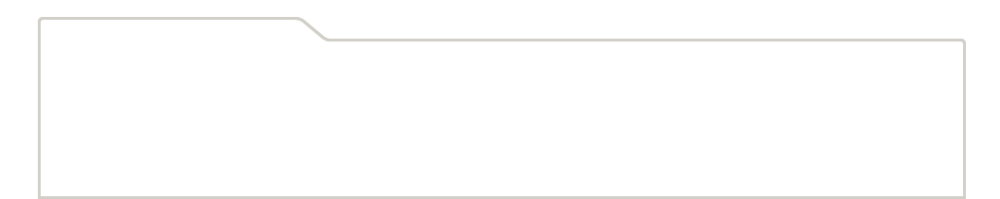
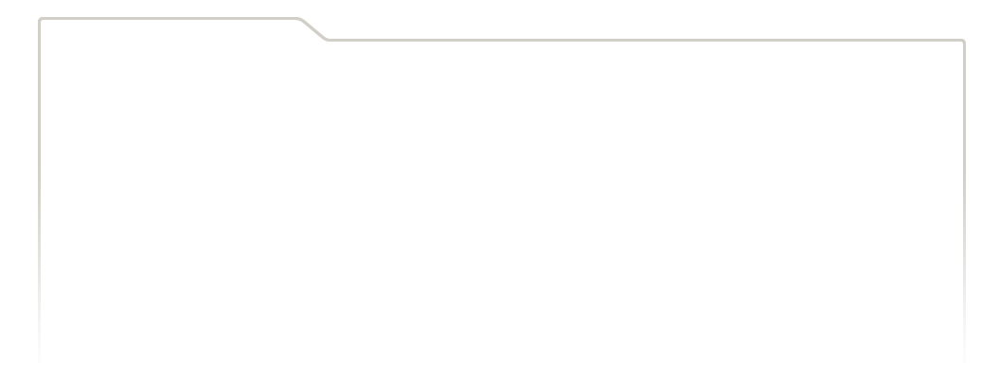
...
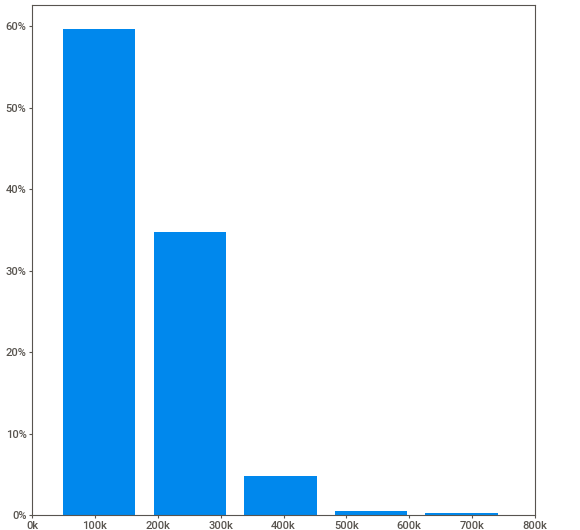
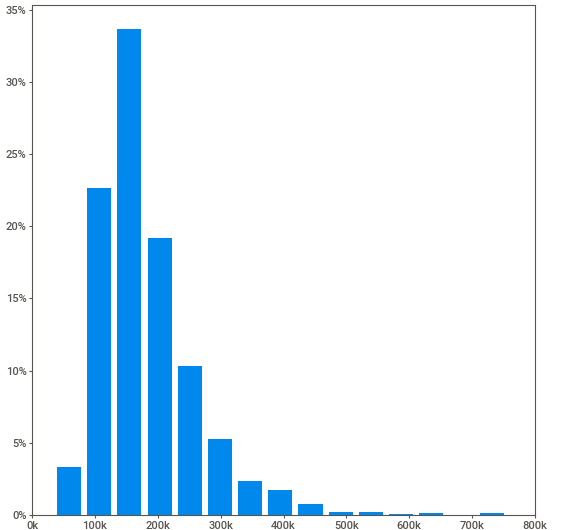
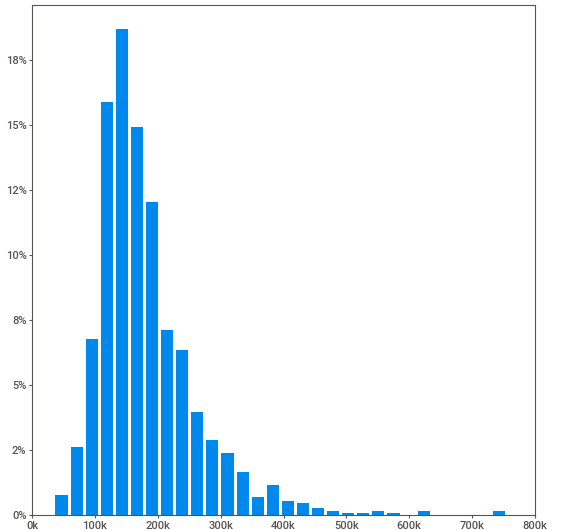
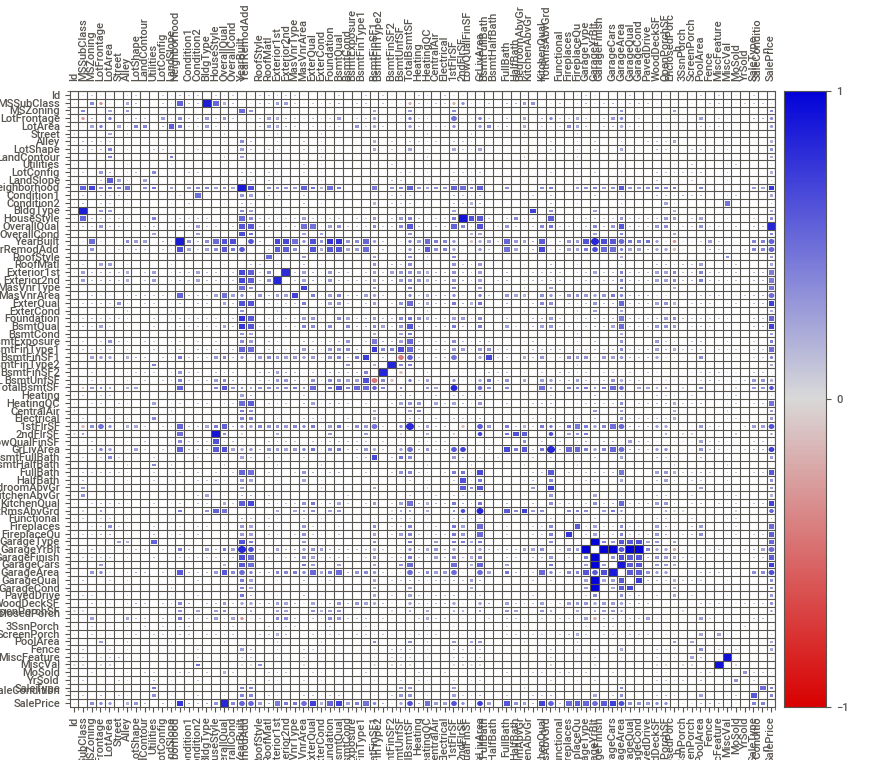
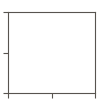

In [ ]:
#import sweetviz and show report on train
import sweetviz as sw

train_report = sw.analyze(train)
train_report.show_notebook(layout='vertical')

Shape of your Data Set loaded: (1460, 81)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  31
    Number of String-Categorical Columns =  37
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  2
    Number of ID Columns =  1
    Number of Columns to Delete =  3
    80 Predictors classified...
        4 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Id', 'Alley', 'PoolQC', 'MiscFeature']

################ Regress

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
LotFrontage,float64,17.739726,NA,21.000000,313.000000,"259 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 88 outliers greater than upper bound (111.50) or lower than lower bound(27.50). Cap them or remove them."
MasVnrArea,float64,0.547945,NA,0.000000,1600.000000,"8 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 96 outliers greater than upper bound (415.00) or lower than lower bound(-249.00). Cap them or remove them."
GarageYrBlt,float64,5.547945,NA,1900.000000,2010.000000,"81 missing values. Impute them with mean, median, mode, or a constant value such as 123."
MSSubClass,int64,0.000000,1,20.000000,190.000000,Column has 103 outliers greater than upper bound (145.00) or lower than lower bound(-55.00). Cap them or remove them.
MSZoning,object,0.000000,0,,,1 rare categories: ['C (all)']. Group them into a single category or drop the categories.
LotArea,int64,0.000000,73,1300.000000,215245.000000,Column has 69 outliers greater than upper bound (17673.50) or lower than lower bound(1481.50). Cap them or remove them.
Street,object,0.000000,0,,,No issue
LotShape,object,0.000000,0,,,1 rare categories: ['IR3']. Group them into a single category or drop the categories.
LandContour,object,0.000000,0,,,No issue
Utilities,object,0.000000,0,,,No issue


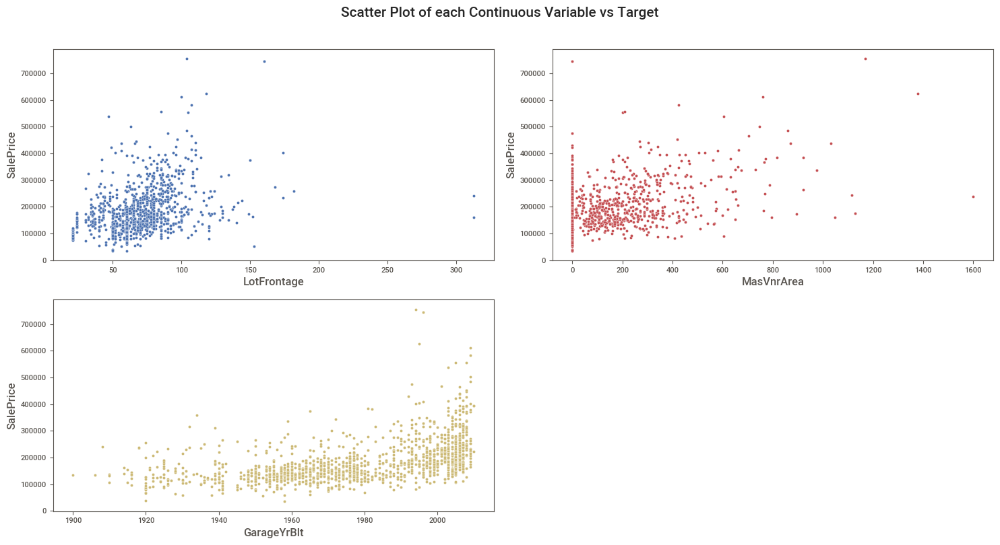

Number of All Scatter Plots = 6


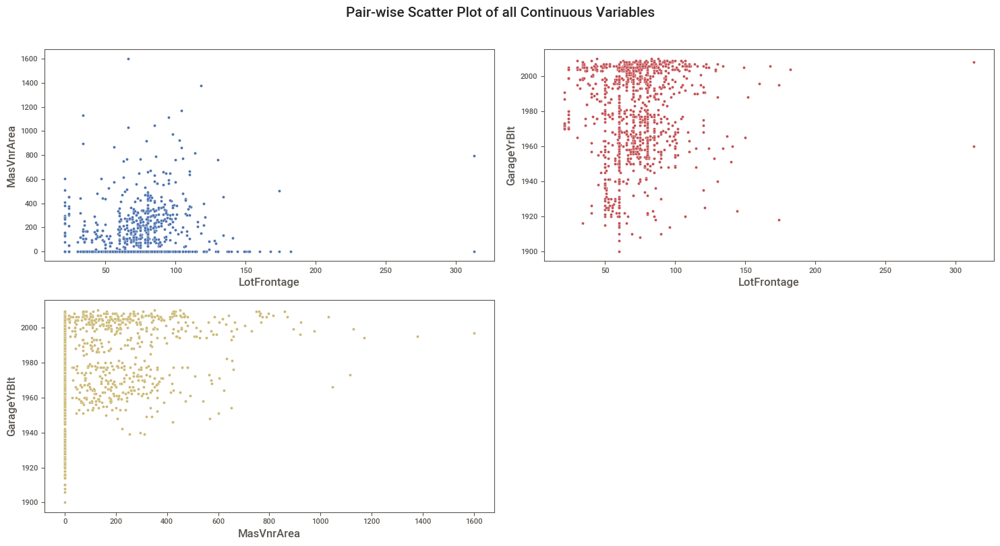

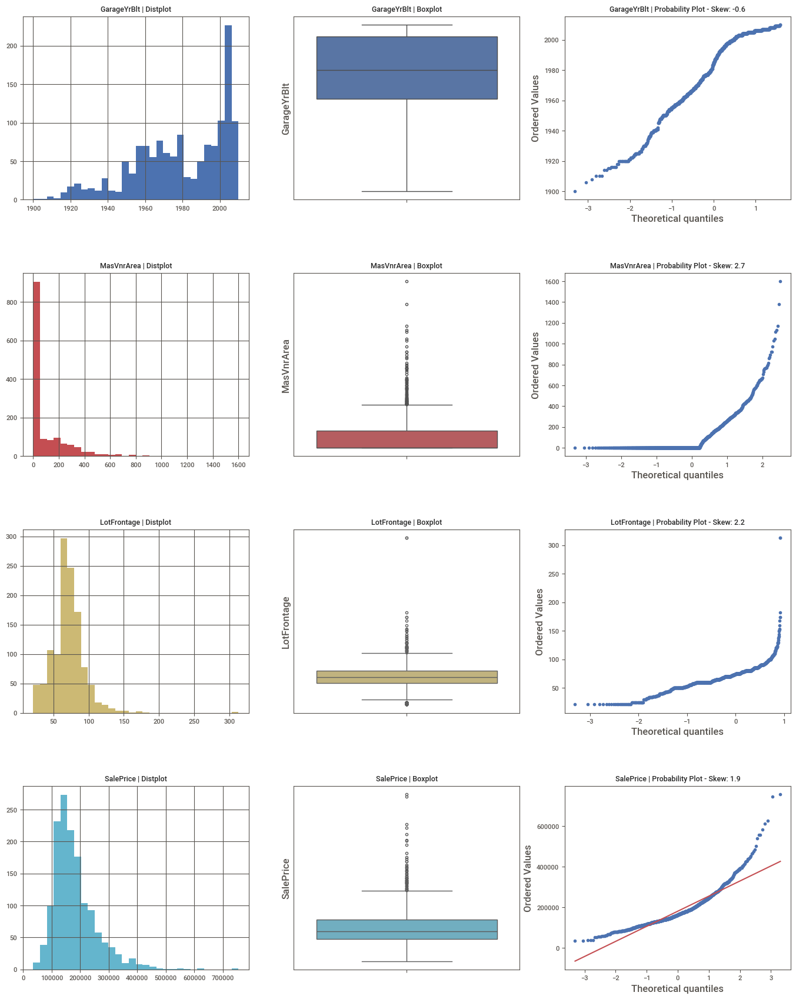

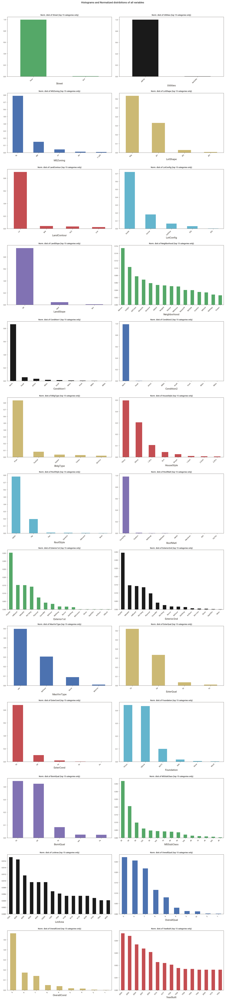

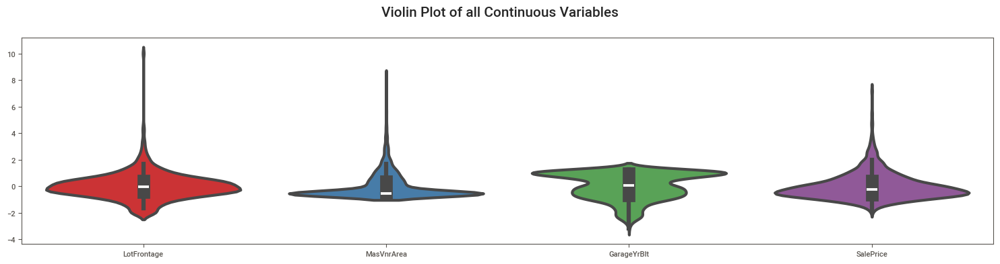

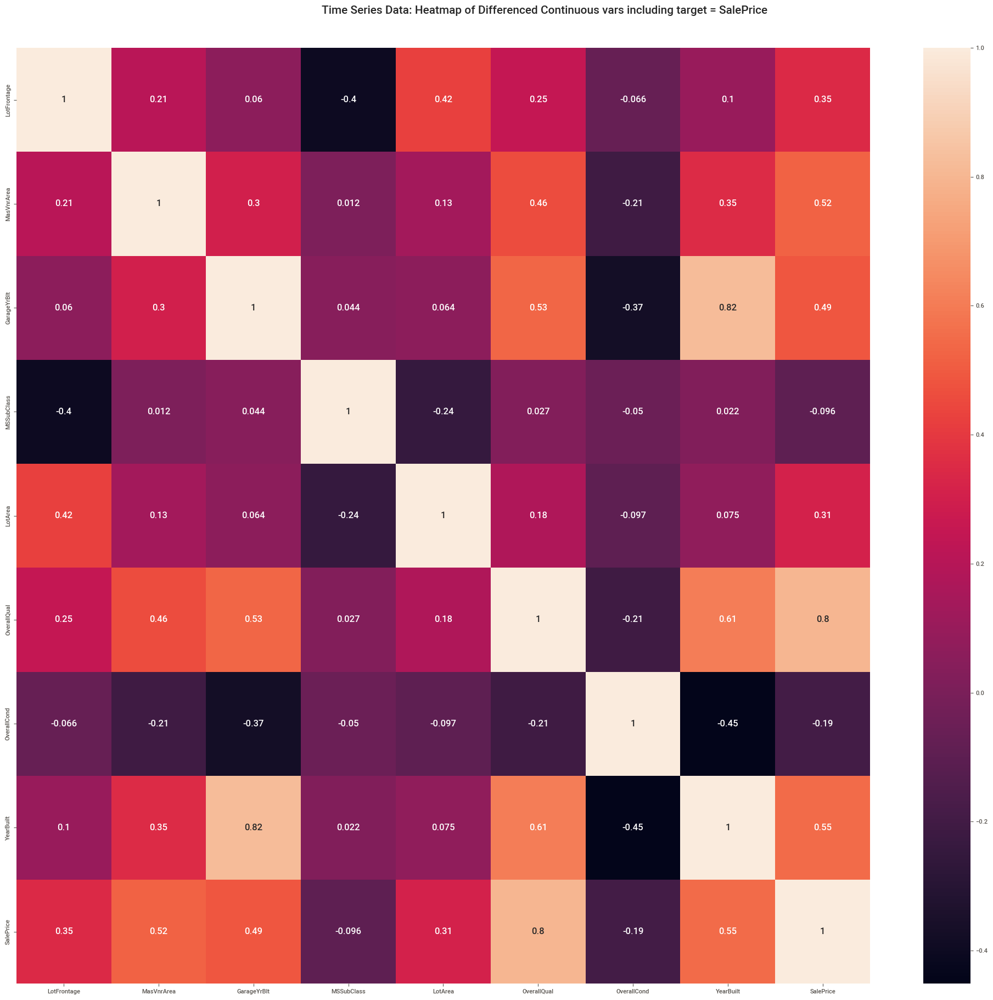

Could not draw some Time Series plots. Could not convert RMRLRMRMC (all)RMRMRMRMRLRLRMRMRMRMRMRMRLRLRMRLRMRLRMRLRMRLRMRMRMRMRLRMRMRMRHRLRLRLRLRLRHRLRLRLRMRLRMRLRLRMRMRMRLRLC (all)RLRLRMRLRLRMC (all)RLRLRLRLRMRLRMRLRLRLRLRLRHRMRMRMRMC (all)RMRLRLRMRMRLRLRLRMRHRMRLRLRLRMRLRMRMRHC (all)RLRHRLRMRLRLRLRMRLRLRLRLRMRLRLRLC (all)RMRLRLRLRMRLRMRLRMRMRLRLRLRMRLRMRLRLRLRLRLRMRLRMRLRHRLRLRMRLRMRLRLRMRLC (all)RMRLRLRLRMRMRMRLRMRLRLRLRMRLRMRMRLRMRLRMRLRMRLRL to numeric


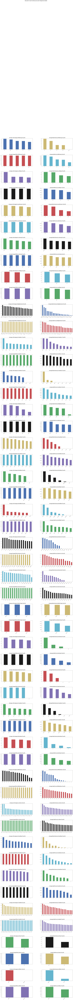

All Plots done
Time to run AutoViz = 71 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
# Import necessary libraries
import pandas as pd
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt

# Ensure inline plotting
%matplotlib inline



# Initialize AutoViz
AV = AutoViz_Class()

# Visualize the dataset
dft = AV.AutoViz("", depVar='SalePrice', dfte=train, verbose=1, chart_format='png')

In [ ]:
# count empty values for column
def count_empty_values_in_each_column(df: pd.DataFrame):
  print('empty values:')
  print('**************\n')

  empty_cols = []
  for col in df.columns:
    empty = df[col].isna().sum()
    if empty != 0:
      empty_cols.append(col)
      print(f"{col}: {empty}")
  print('\n**************\n')
  return empty_cols

In [ ]:
# check if there is empty columns in train
train_empty_columns = count_empty_values_in_each_column(train)

empty values:
**************

LotFrontage: 259
Alley: 1369
MasVnrType: 872
MasVnrArea: 8
BsmtQual: 37
BsmtCond: 37
BsmtExposure: 38
BsmtFinType1: 37
BsmtFinType2: 38
Electrical: 1
FireplaceQu: 690
GarageType: 81
GarageYrBlt: 81
GarageFinish: 81
GarageQual: 81
GarageCond: 81
PoolQC: 1453
Fence: 1179
MiscFeature: 1406

**************



**Upon inspection, it's evident that features such as Alley, PoolQC, Fence, and MiscFeature contain a significant number of missing values. To streamline our dataset, we will remove these features entirely. For the remaining features with missing values, we can apply appropriate methods to fill in the gaps and ensure completeness in our dataframe.**

In [ ]:
# display the Dtype of each empty column in data frame
def get_dtype_info_for_columns(df, cols):
    pd.DataFrame(df, columns=cols).info()

In [ ]:
# display the Dtype of each empty column in train
get_dtype_info_for_columns(train, train_empty_columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LotFrontage   1201 non-null   float64
 1   Alley         91 non-null     object 
 2   MasVnrType    588 non-null    object 
 3   MasVnrArea    1452 non-null   float64
 4   BsmtQual      1423 non-null   object 
 5   BsmtCond      1423 non-null   object 
 6   BsmtExposure  1422 non-null   object 
 7   BsmtFinType1  1423 non-null   object 
 8   BsmtFinType2  1422 non-null   object 
 9   Electrical    1459 non-null   object 
 10  FireplaceQu   770 non-null    object 
 11  GarageType    1379 non-null   object 
 12  GarageYrBlt   1379 non-null   float64
 13  GarageFinish  1379 non-null   object 
 14  GarageQual    1379 non-null   object 
 15  GarageCond    1379 non-null   object 
 16  PoolQC        7 non-null      object 
 17  Fence         281 non-null    object 
 18  MiscFeature   54 non-null   

In [ ]:
# drop Id feature and features with too many(> 50%) of missing values also
columns_to_drop = ['Id', 'Alley', 'PoolQC', 'Fence', 'MiscFeature']
train.drop(columns_to_drop, axis=1, inplace=True)
test.drop(columns_to_drop, axis=1, inplace=True)

In [ ]:
# fill empty values by median value for each column in the dataframe
def fill_na_median(df, col_names):
  for col_name in col_names:
    df_not_null = df[~df[col_name].isnull()]
    df[col_name].fillna(df_not_null[col_name].median(), inplace=True)

# fill empty values by mode value for each column in the dataframe
def fill_na_mode(df, col_names):
  for col_name in col_names:
    df[col_name].fillna(df[col_name].mode()[0], inplace=True)

# fill empty values by mean value for each column in the dataframe
def fill_na_mean(df, col_names):
  for col_name in col_names:
    df_not_null = df[~df[col_name].isnull()]
    df[col_name].fillna(df_not_null[col_name].mean(), inplace=True)

In [ ]:
# import make_subplots and create pie charts subplots of the categorical features
from plotly.subplots import make_subplots

def create_pie_chart_subplot_of_count(df, col_names):
    rows = int(np.ceil(np.sqrt(len(col_names))))
    cols = int(np.ceil(len(col_names)/rows))
    fig = make_subplots(rows=rows, cols=cols, specs=[[{"type": "domain"} for i in range(cols)] for j in range(rows)])
    for i, col_name in enumerate(col_names):
        df_not_null = df[~df[col_name].isnull()]
        fig.add_trace(go.Pie(labels=df_not_null.groupby([col_name]).size().reset_index(name='count')[col_name],
                             values=df_not_null.groupby([col_name]).size().reset_index(name='count')['count'],
                             name=col_name),
                      (i)//cols+1, (i)%cols+1)
    fig.update_layout(margin=dict(t=10, l=10, r=10, b=10))
    fig.show()

In [ ]:
categorical_features = ['GarageFinish', 'GarageQual','BsmtExposure', 'BsmtFinType1', 'BsmtFinType2','BsmtQual','Electrical', 'FireplaceQu', 'GarageType', 'GarageCond','BsmtCond', 'MasVnrType']

In [ ]:
# display pie chart for all categorial features
create_pie_chart_subplot_of_count(train, categorical_features)

In [ ]:
# fill empty values in train dataframe
fill_na_median(train, ['LotFrontage', 'GarageYrBlt'])
fill_na_mean(train, ['MasVnrArea'])
fill_na_mode(train, categorical_features)

In [ ]:
# check if there is no more missing values in train
train_empty_columns = count_empty_values_in_each_column(train)

empty values:
**************


**************



**The list is empty so now all the features in train have values.**

In [ ]:
# check if there is empty columns in test
test_empty_columns = count_empty_values_in_each_column(test)

empty values:
**************

MSZoning: 4
LotFrontage: 227
Utilities: 2
Exterior1st: 1
Exterior2nd: 1
MasVnrType: 894
MasVnrArea: 15
BsmtQual: 44
BsmtCond: 45
BsmtExposure: 44
BsmtFinType1: 42
BsmtFinSF1: 1
BsmtFinType2: 42
BsmtFinSF2: 1
BsmtUnfSF: 1
TotalBsmtSF: 1
BsmtFullBath: 2
BsmtHalfBath: 2
KitchenQual: 1
Functional: 2
FireplaceQu: 730
GarageType: 76
GarageYrBlt: 78
GarageFinish: 78
GarageCars: 1
GarageArea: 1
GarageQual: 78
GarageCond: 78
SaleType: 1

**************



In [ ]:
# display the Dtype of each empty column in test
get_dtype_info_for_columns(test, test_empty_columns)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 29 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MSZoning      1455 non-null   object 
 1   LotFrontage   1232 non-null   float64
 2   Utilities     1457 non-null   object 
 3   Exterior1st   1458 non-null   object 
 4   Exterior2nd   1458 non-null   object 
 5   MasVnrType    565 non-null    object 
 6   MasVnrArea    1444 non-null   float64
 7   BsmtQual      1415 non-null   object 
 8   BsmtCond      1414 non-null   object 
 9   BsmtExposure  1415 non-null   object 
 10  BsmtFinType1  1417 non-null   object 
 11  BsmtFinSF1    1458 non-null   float64
 12  BsmtFinType2  1417 non-null   object 
 13  BsmtFinSF2    1458 non-null   float64
 14  BsmtUnfSF     1458 non-null   float64
 15  TotalBsmtSF   1458 non-null   float64
 16  BsmtFullBath  1457 non-null   float64
 17  BsmtHalfBath  1457 non-null   float64
 18  KitchenQual   1458 non-null 

In [ ]:
# fill empty values in test dataframe
fill_na_median(test, ['BsmtFinSF2', 'GarageCars', 'LotFrontage', 'BsmtFullBath', 'GarageYrBlt', 'BsmtFinSF1', 'TotalBsmtSF', 'BsmtUnfSF', 'BsmtHalfBath'])
fill_na_mean(test, ['MasVnrArea', 'GarageArea'])
fill_na_mode(test, ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond','MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'KitchenQual', 'Functional', 'FireplaceQu', 'SaleType', 'BsmtFinType1', 'BsmtFinType2', 'MasVnrType'])

In [ ]:
# check if there is no more missing values in test
test_empty_columns = count_empty_values_in_each_column(test)

empty values:
**************


**************



In [ ]:
# show train description
train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,22.027677,9981.264932,1.382997,1.112799,30.202904,20.645407,180.569112,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


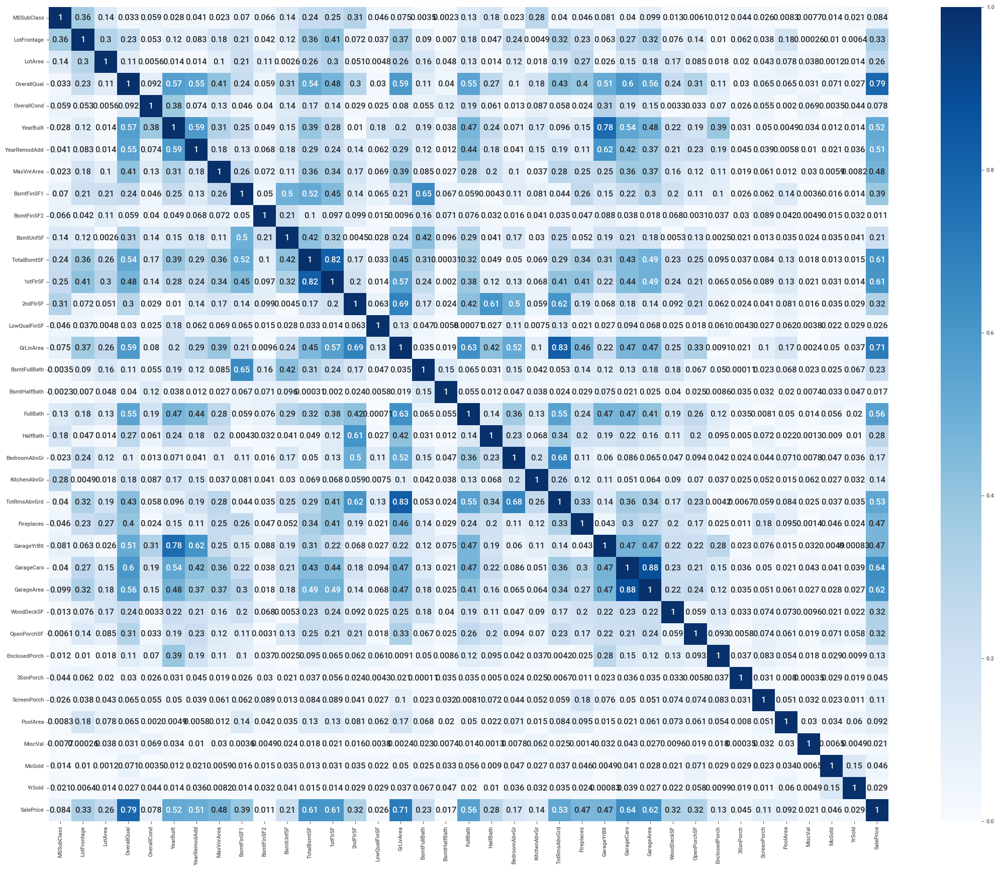

In [ ]:
# display heatmap of train
train_numeric = train.select_dtypes(include=['int64', 'float64'])  # Select numeric columns

plt.figure(figsize=(24,20))
cor = abs(train_numeric.corr())
sns.heatmap(cor, annot=True, cmap=plt.cm.Blues, vmin=0, vmax=1)
plt.show()

**After examining the heatmap, we've identified features that exhibit very low correlation with the target variable SalePrice. To streamline our analysis, we plan to drop these features from the dataframe.**

In [ ]:
# find the low correlation features to SalePrice
low_correlation_features=cor[cor['SalePrice'] < 0.22].index
low_correlation_features

Index(['MSSubClass', 'OverallCond', 'BsmtFinSF2', 'BsmtUnfSF', 'LowQualFinSF',
       'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'EnclosedPorch',
       '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')

In [ ]:
# drop low corrlations features from train and test
train.drop(low_correlation_features, axis=1, inplace=True)
test.drop(low_correlation_features, axis=1, inplace=True)

# Cross Validation

In [ ]:
# divide the data to features and target
t = train['SalePrice'].copy()
X = train.drop(['SalePrice'], axis=1)
print('t')
display(t)
print()
print('X')
display(X)

t


0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64


X


,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,SaleType,SaleCondition
0,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,856,GasA,Ex,Y,SBrkr,856,854,1710,1,2,1,Gd,8,Typ,0,Gd,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,WD,Normal
1,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,1976,1976,Gable,CompShg,MetalSd,MetalSd,BrkFace,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,1262,GasA,Ex,Y,SBrkr,1262,0,1262,0,2,0,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,WD,Normal
2,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,920,GasA,Ex,Y,SBrkr,920,866,1786,1,2,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,WD,Normal
3,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,BrkFace,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,756,GasA,Gd,Y,SBrkr,961,756,1717,1,1,0,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,WD,Abnorml
4,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,1145,GasA,Ex,Y,SBrkr,1145,1053,2198,1,2,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,953,GasA,Ex,Y,SBrkr,953,694,1647,0,2,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,WD,Normal
1456,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,1542,GasA,TA,Y,SBrkr,2073,0,2073,1,2,0,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,WD,Normal
1457,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1941,2006,Gable,CompShg,CemntBd,CmentBd,BrkFace,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,1152,GasA,Ex,Y,SBrkr,1188,1152,2340,0,2,0,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,WD,Normal
1458,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,1950,1996,Hip,CompShg,MetalSd,MetalSd,BrkFace,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1078,GasA,Gd,Y,FuseA,1078,0,1078,1,1,0,Gd,5,Typ,0,Gd,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,WD,Normal


In [ ]:
# find generator length
from tqdm.auto import tqdm

def find_generator_len(generator, use_pbar=True):
    i = 0
    if use_pbar:
        pbar = tqdm(desc='Calculating Length', ncols=1000, bar_format='{desc}{bar:10}{r_bar}')
    for a in generator:
        i += 1
        if use_pbar:
            pbar.update()
    if use_pbar:
        pbar.close()

    return i

In [ ]:
# calculate score and loss from cv (KFold or LPO) and display graphs
def get_cv_score_and_loss(X, t, model, k=None, p=None, show_score_loss_graphs=False, use_pbar=True):
    scores_losses_df = pd.DataFrame(columns=['fold_id', 'split', 'score', 'loss'])

    if k is not None:
        cv = KFold(n_splits=k, shuffle=True, random_state=1)
    elif p is not None:
        cv = LeavePOut(p)
    else:
        raise ValueError('you need to specify k or p in order for the cv to work')

    if use_pbar:
        pbar = tqdm(desc='Computing Models', total=find_generator_len(cv.split(X)))

    for i, (train_ids, val_ids) in enumerate(cv.split(X)):
        X_train = X.loc[train_ids]
        t_train = t.loc[train_ids]
        X_val = X.loc[val_ids]
        t_val = t.loc[val_ids]

        model.fit(X_train, t_train)

        y_train = model.predict(X_train)
        y_val = model.predict(X_val)
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'train', model.score(X_train, t_train), mean_squared_error(t_train, y_train, squared=False)]
        scores_losses_df.loc[len(scores_losses_df)] = [i, 'val', model.score(X_val, t_val), mean_squared_error(t_val, y_val, squared=False)]

        if use_pbar:
            pbar.update()

    if use_pbar:
        pbar.close()

    val_scores_losses_df = scores_losses_df[scores_losses_df['split']=='val']
    train_scores_losses_df = scores_losses_df[scores_losses_df['split']=='train']

    mean_val_score = val_scores_losses_df['score'].mean()
    mean_val_loss = val_scores_losses_df['loss'].mean()
    mean_train_score = train_scores_losses_df['score'].mean()
    mean_train_loss = train_scores_losses_df['loss'].mean()

    if show_score_loss_graphs:
        fig = px.line(scores_losses_df, x='fold_id', y='score', color='split', title=f'Mean Val Score: {mean_val_score:.2f}, Mean Train Score: {mean_train_score:.2f}')
        fig.show()
        fig = px.line(scores_losses_df, x='fold_id', y='loss', color='split', title=f'Mean Val Loss: {mean_val_loss:.2f}, Mean Train Loss: {mean_train_loss:.2f}')
        fig.show()

    return mean_val_score, mean_val_loss, mean_train_score, mean_train_loss

In [ ]:
def eval_model(X, model):
  val_score, val_loss, train_score, train_loss = get_cv_score_and_loss(X, t, model, k=10, show_score_loss_graphs=True)
  print(f'mean cv value score: {val_score:.2f}\nmean cv value loss {val_loss:.2f}')
  print(f'mean cv value score: {train_score:.2f}\nmean cv value loss {train_loss:.2f}')

In [ ]:
# determine categorical and numerical features
numeric_columns = X.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = X.select_dtypes(include=['object', 'bool']).columns
all_columns = np.array(X.columns)

print('Numeric Columns:', numeric_columns, 'size:', len(numeric_columns))
print('Categorical Columns:', categorical_columns, 'size:', len(categorical_columns))
print('All Columns:', all_columns, 'size:', len(all_columns))

Numeric Columns: Index(['LotFrontage', 'LotArea', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF'],
      dtype='object') size: 21
Categorical Columns: Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition'],
      dtyp

In [ ]:
# use column transformer to insert different transformers for each column
from sklearn.compose import ColumnTransformer

ct = ColumnTransformer([
    ("encoding", OrdinalEncoder(), categorical_columns),
    ("standard", MinMaxScaler(), numeric_columns)])

X_encoded = pd.DataFrame(ct.fit_transform(X, t), columns=all_columns)
test_encoded = pd.DataFrame(ct.fit_transform(test), columns=all_columns)

print("X encoded")
display(X_encoded)
print("test encoded")
display(test_encoded)

X encoded


,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,SaleType,SaleCondition
0,3.0,1.0,3.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,1.0,2.0,4.0,2.0,2.0,3.0,3.0,2.0,5.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.150685,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.140098,0.119780,0.413559,0.259231,0.333333,0.666667,0.5,0.500000,0.000000,0.936364,0.50,0.386460,0.000000,0.111517
1,3.0,1.0,3.0,3.0,0.0,2.0,0.0,24.0,1.0,2.0,0.0,2.0,1.0,1.0,8.0,8.0,1.0,3.0,4.0,1.0,2.0,3.0,1.0,0.0,5.0,1.0,0.0,1.0,4.0,3.0,6.0,4.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.202055,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.206547,0.212942,0.000000,0.174830,0.000000,0.666667,0.0,0.333333,0.333333,0.690909,0.50,0.324401,0.347725,0.000000
2,3.0,1.0,0.0,3.0,0.0,4.0,0.0,5.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,1.0,2.0,4.0,2.0,2.0,3.0,2.0,2.0,5.0,1.0,0.0,1.0,4.0,2.0,6.0,4.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.160959,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.150573,0.134465,0.419370,0.273549,0.333333,0.666667,0.5,0.333333,0.333333,0.918182,0.50,0.428773,0.000000,0.076782
3,3.0,1.0,0.0,3.0,0.0,0.0,0.0,6.0,2.0,2.0,0.0,5.0,1.0,1.0,13.0,15.0,1.0,3.0,4.0,0.0,3.0,1.0,3.0,0.0,5.0,1.0,2.0,1.0,4.0,2.0,6.0,2.0,5.0,2.0,4.0,4.0,2.0,8.0,0.0,0.133562,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.123732,0.143873,0.366102,0.260550,0.333333,0.333333,0.0,0.416667,0.333333,0.890909,0.75,0.452750,0.000000,0.063985
4,3.0,1.0,0.0,3.0,0.0,2.0,0.0,15.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,1.0,2.0,4.0,2.0,2.0,3.0,0.0,2.0,5.0,1.0,0.0,1.0,4.0,2.0,6.0,4.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.215753,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.187398,0.186095,0.509927,0.351168,0.333333,0.666667,0.5,0.583333,0.333333,0.909091,0.75,0.589563,0.224037,0.153565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3.0,1.0,3.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,5.0,1.0,1.0,12.0,13.0,1.0,3.0,4.0,2.0,2.0,3.0,3.0,5.0,5.0,1.0,0.0,1.0,4.0,3.0,6.0,4.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.140411,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.155974,0.142038,0.336077,0.247362,0.000000,0.666667,0.5,0.416667,0.333333,0.900000,0.50,0.324401,0.000000,0.073126
1456,3.0,1.0,3.0,3.0,0.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,1.0,1.0,9.0,10.0,2.0,3.0,4.0,1.0,2.0,3.0,3.0,0.0,4.0,1.0,4.0,1.0,4.0,3.0,2.0,4.0,1.0,2.0,4.0,4.0,2.0,8.0,4.0,0.219178,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252373,0.399036,0.000000,0.327619,0.333333,0.666667,0.0,0.416667,0.666667,0.709091,0.50,0.352609,0.407235,0.000000
1457,3.0,1.0,3.0,3.0,0.0,4.0,0.0,6.0,2.0,2.0,0.0,5.0,1.0,1.0,5.0,5.0,1.0,0.0,2.0,4.0,3.0,1.0,3.0,2.0,5.0,1.0,0.0,1.0,4.0,2.0,6.0,2.0,1.0,1.0,4.0,4.0,2.0,8.0,4.0,0.154110,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.188543,0.195961,0.557869,0.377920,0.000000,0.666667,0.0,0.583333,0.666667,0.372727,0.25,0.177715,0.000000,0.109689
1458,3.0,1.0,3.0,3.0,0.0,4.0,0.0,12.0,2.0,2.0,0.0,2.0,3.0,1.0,8.0,8.0,1.0,3.0,4.0,1.0,3.0,3.0,2.0,2.0,4.0,1.0,2.0,1.0,0.0,2.0,6.0,2.0,1.0,2.0,4.0,4.0,2.0,8.0,4.0,0.160959,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.176432,0.170721,0.000000,0.140166,0.333333,0.333333,0.0,0.250000,0.000000,0.454545,0.25,0.169252,0.427071,0.000000


test encoded


,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,SaleType,SaleCondition
0,2.0,1.0,3.0,3.0,0.0,4.0,0.0,12.0,1.0,2.0,0.0,2.0,1.0,0.0,10.0,12.0,1.0,3.0,4.0,1.0,3.0,3.0,3.0,4.0,3.0,0.0,4.0,1.0,3.0,3.0,6.0,2.0,1.0,2.0,3.0,4.0,2.0,8.0,4.0,0.329609,0.184147,0.444444,0.625954,0.183333,0.000000,0.116708,0.173111,0.104309,0.000000,0.104309,0.000000,0.25,0.0,0.166667,0.00,0.211538,0.2,0.490591,0.098315,0.000000
1,3.0,1.0,0.0,3.0,0.0,0.0,0.0,12.0,2.0,2.0,0.0,2.0,3.0,0.0,11.0,13.0,1.0,3.0,4.0,1.0,3.0,3.0,3.0,0.0,5.0,0.0,4.0,1.0,3.0,2.0,6.0,2.0,1.0,2.0,3.0,4.0,2.0,8.0,4.0,0.335196,0.232124,0.555556,0.603053,0.133333,0.083721,0.230175,0.260844,0.196672,0.000000,0.196672,0.000000,0.25,0.5,0.250000,0.00,0.201923,0.2,0.209677,0.275983,0.048518
2,3.0,1.0,0.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,4.0,1.0,0.0,10.0,12.0,1.0,3.0,4.0,2.0,2.0,3.0,3.0,2.0,5.0,0.0,2.0,1.0,3.0,3.0,6.0,4.0,1.0,0.0,3.0,4.0,2.0,8.0,4.0,0.296089,0.224197,0.444444,0.900763,0.800000,0.000000,0.197257,0.182139,0.111135,0.376477,0.260666,0.000000,0.50,0.5,0.250000,0.25,0.326923,0.4,0.323925,0.148876,0.045822
3,3.0,1.0,0.0,3.0,0.0,4.0,0.0,8.0,2.0,2.0,0.0,4.0,1.0,0.0,10.0,12.0,1.0,3.0,4.0,2.0,3.0,3.0,3.0,2.0,5.0,0.0,0.0,1.0,3.0,2.0,6.0,2.0,1.0,0.0,3.0,4.0,2.0,8.0,4.0,0.318436,0.154326,0.555556,0.908397,0.800000,0.015504,0.150125,0.181747,0.110708,0.364125,0.255333,0.000000,0.50,0.5,0.333333,0.25,0.330128,0.4,0.315860,0.252809,0.048518
4,3.0,1.0,0.0,1.0,0.0,4.0,0.0,22.0,2.0,2.0,4.0,2.0,1.0,0.0,6.0,6.0,1.0,2.0,4.0,2.0,2.0,3.0,3.0,0.0,5.0,0.0,0.0,1.0,3.0,2.0,6.0,2.0,1.0,1.0,3.0,4.0,2.0,8.0,4.0,0.122905,0.064121,0.777778,0.862595,0.700000,0.000000,0.065586,0.251227,0.186220,0.000000,0.186220,0.000000,0.50,0.0,0.166667,0.00,0.310897,0.4,0.340054,0.000000,0.110512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,4.0,1.0,3.0,3.0,0.0,4.0,0.0,10.0,2.0,2.0,3.0,4.0,1.0,0.0,5.0,5.0,1.0,3.0,4.0,1.0,3.0,3.0,3.0,5.0,5.0,0.0,2.0,1.0,3.0,3.0,6.0,2.0,1.0,2.0,3.0,4.0,2.0,8.0,4.0,0.000000,0.008453,0.333333,0.694656,0.333333,0.000000,0.000000,0.107164,0.029650,0.293233,0.146118,0.000000,0.25,0.5,0.166667,0.00,0.269231,0.0,0.000000,0.000000,0.000000
1455,4.0,1.0,3.0,3.0,0.0,4.0,0.0,10.0,2.0,2.0,4.0,4.0,1.0,0.0,5.0,5.0,1.0,3.0,4.0,1.0,3.0,3.0,3.0,4.0,5.0,0.0,4.0,1.0,3.0,3.0,6.0,2.0,4.0,2.0,3.0,4.0,2.0,8.0,0.0,0.000000,0.007691,0.333333,0.694656,0.333333,0.000000,0.062843,0.107164,0.029650,0.293233,0.146118,0.000000,0.25,0.5,0.250000,0.00,0.240385,0.2,0.192204,0.000000,0.032345
1456,3.0,1.0,3.0,3.0,0.0,4.0,0.0,11.0,2.0,2.0,0.0,2.0,1.0,0.0,10.0,12.0,1.0,3.0,4.0,1.0,3.0,3.0,3.0,0.0,5.0,0.0,0.0,1.0,3.0,3.0,6.0,4.0,5.0,2.0,3.0,4.0,2.0,8.0,0.0,0.776536,0.336115,0.444444,0.618321,0.766667,0.000000,0.305237,0.240236,0.174275,0.000000,0.174275,0.333333,0.25,0.0,0.333333,0.25,0.208333,0.4,0.387097,0.332865,0.000000
1457,3.0,1.0,3.0,3.0,0.0,4.0,0.0,11.0,2.0,2.0,0.0,5.0,1.0,0.0,6.0,14.0,1.0,3.0,4.0,2.0,2.0,3.0,0.0,2.0,5.0,0.0,4.0,1.0,3.0,3.0,6.0,2.0,1.0,2.0,3.0,4.0,2.0,8.0,4.0,0.229050,0.162724,0.444444,0.862595,0.700000,0.000000,0.084040,0.178999,0.120094,0.000000,0.120094,0.000000,0.25,0.0,0.250000,0.00,0.269231,0.0,0.000000,0.056180,0.043127


# Feature Selection




![](https://miro.medium.com/v2/resize:fit:640/format:webp/1*fN29S0QP55qJJ9hvVWm7ZA.gif)

In [ ]:
# find best subset of features on this dataset with SGDRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import RepeatedKFold

selector_sgd = RFECV(SGDRegressor(random_state=1), cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=1)).fit(X_encoded, t)
X_selected_features_sgd = X_encoded.loc[:, selector_sgd.support_]
display(X_selected_features_sgd)

,LotFrontage,Street,Utilities,Neighborhood,Condition1,BldgType,HouseStyle,YearRemodAdd,RoofStyle,Exterior2nd,MasVnrType,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtFinType2,CentralAir,Electrical,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,SaleType,SaleCondition
0,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,2.0,2.0,3.0,1.0,2.0,6.0,2.0,4.0,2.0,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.140098,0.119780,0.413559,0.259231,0.333333,0.666667,0.5,0.500000,0.000000,0.936364,0.50,0.386460,0.000000,0.111517
1,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,3.0,2.0,3.0,1.0,3.0,6.0,4.0,4.0,2.0,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.206547,0.212942,0.000000,0.174830,0.000000,0.666667,0.0,0.333333,0.333333,0.690909,0.50,0.324401,0.347725,0.000000
2,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,2.0,2.0,3.0,1.0,2.0,6.0,4.0,4.0,2.0,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.150573,0.134465,0.419370,0.273549,0.333333,0.666667,0.5,0.333333,0.333333,0.918182,0.50,0.428773,0.000000,0.076782
3,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,3.0,3.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.123732,0.143873,0.366102,0.260550,0.333333,0.333333,0.0,0.416667,0.333333,0.890909,0.75,0.452750,0.000000,0.063985
4,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,2.0,2.0,3.0,1.0,2.0,6.0,4.0,4.0,2.0,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.187398,0.186095,0.509927,0.351168,0.333333,0.666667,0.5,0.583333,0.333333,0.909091,0.75,0.589563,0.224037,0.153565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,3.0,2.0,3.0,1.0,3.0,6.0,4.0,4.0,2.0,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.155974,0.142038,0.336077,0.247362,0.000000,0.666667,0.5,0.416667,0.333333,0.900000,0.50,0.324401,0.000000,0.073126
1456,1.0,3.0,0.0,2.0,0.0,1.0,1.0,2.0,3.0,2.0,3.0,1.0,3.0,2.0,4.0,4.0,2.0,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252373,0.399036,0.000000,0.327619,0.333333,0.666667,0.0,0.416667,0.666667,0.709091,0.50,0.352609,0.407235,0.000000
1457,1.0,3.0,0.0,2.0,0.0,1.0,1.0,1.0,0.0,3.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.188543,0.195961,0.557869,0.377920,0.000000,0.666667,0.0,0.583333,0.666667,0.372727,0.25,0.177715,0.000000,0.109689
1458,1.0,3.0,0.0,2.0,0.0,3.0,1.0,1.0,3.0,3.0,3.0,1.0,2.0,6.0,2.0,4.0,2.0,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.176432,0.170721,0.000000,0.140166,0.333333,0.333333,0.0,0.250000,0.000000,0.454545,0.25,0.169252,0.427071,0.000000


In [ ]:
# find best subset of features on this dataset with LinearRegression
selector_lr = RFECV(LinearRegression(), cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=1)).fit(X_encoded, t)
X_selected_features_lr = X_encoded.loc[:, selector_lr.support_]
display(X_selected_features_lr)

,MSZoning,LotFrontage,LotArea,Street,LotShape,Utilities,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearRemodAdd,RoofStyle,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtCond,BsmtFinType1,BsmtFinSF1,BsmtFinType2,CentralAir,Electrical,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,SaleType
0,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,2.0,2.0,3.0,3.0,2.0,5.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,4.0,0.150685,0.033420,0.666667,0.949275,0.883333,0.122500,0.125089,0.140098,0.119780,0.413559,0.259231,0.333333,0.666667,0.5,0.500000,0.000000,0.936364,0.50,0.000000
1,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,2.0,1.0,1.0,1.0,3.0,2.0,3.0,1.0,0.0,5.0,1.0,1.0,3.0,6.0,4.0,4.0,2.0,4.0,0.202055,0.038795,0.555556,0.753623,0.433333,0.000000,0.173281,0.206547,0.212942,0.000000,0.174830,0.000000,0.666667,0.0,0.333333,0.333333,0.690909,0.50,0.347725
2,3.0,1.0,0.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,2.0,2.0,3.0,2.0,2.0,5.0,1.0,1.0,2.0,6.0,4.0,4.0,2.0,4.0,0.160959,0.046507,0.666667,0.934783,0.866667,0.101250,0.086109,0.150573,0.134465,0.419370,0.273549,0.333333,0.666667,0.5,0.333333,0.333333,0.918182,0.50,0.000000
3,3.0,1.0,0.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,3.0,3.0,1.0,3.0,0.0,5.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,0.0,0.133562,0.038561,0.666667,0.311594,0.333333,0.000000,0.038271,0.123732,0.143873,0.366102,0.260550,0.333333,0.333333,0.0,0.416667,0.333333,0.890909,0.75,0.000000
4,3.0,1.0,0.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,2.0,2.0,3.0,0.0,2.0,5.0,1.0,1.0,2.0,6.0,4.0,4.0,2.0,4.0,0.215753,0.060576,0.777778,0.927536,0.833333,0.218750,0.116052,0.187398,0.186095,0.509927,0.351168,0.333333,0.666667,0.5,0.583333,0.333333,0.909091,0.75,0.224037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,3.0,2.0,3.0,3.0,5.0,5.0,1.0,1.0,3.0,6.0,4.0,4.0,2.0,4.0,0.140411,0.030929,0.555556,0.920290,0.833333,0.000000,0.000000,0.155974,0.142038,0.336077,0.247362,0.000000,0.666667,0.5,0.416667,0.333333,0.900000,0.50,0.000000
1456,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,2.0,1.0,1.0,2.0,3.0,2.0,3.0,3.0,0.0,4.0,1.0,1.0,3.0,2.0,4.0,4.0,2.0,4.0,0.219178,0.055505,0.555556,0.768116,0.633333,0.074375,0.139972,0.252373,0.399036,0.000000,0.327619,0.333333,0.666667,0.0,0.416667,0.666667,0.709091,0.50,0.407235
1457,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,5.0,1.0,1.0,1.0,0.0,3.0,1.0,3.0,2.0,5.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,4.0,0.154110,0.036187,0.666667,0.500000,0.933333,0.000000,0.048724,0.188543,0.195961,0.557869,0.377920,0.000000,0.666667,0.0,0.583333,0.666667,0.372727,0.25,0.000000
1458,3.0,1.0,3.0,3.0,0.0,0.0,2.0,0.0,2.0,3.0,1.0,1.0,3.0,3.0,3.0,2.0,2.0,4.0,1.0,1.0,2.0,6.0,2.0,4.0,2.0,4.0,0.160959,0.039342,0.444444,0.565217,0.766667,0.000000,0.008682,0.176432,0.170721,0.000000,0.140166,0.333333,0.333333,0.0,0.250000,0.000000,0.454545,0.25,0.427071


In [ ]:
print('SGDRegressor')
eval_model(X_selected_features_sgd, selector_sgd)

print('LinearRegression')
eval_model(X_selected_features_lr, selector_lr)

SGDRegressor


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

mean cv value score: 0.79
mean cv value loss 35036.39
mean cv value score: 0.82
mean cv value loss 33694.45
LinearRegression


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

mean cv value score: 0.79
mean cv value loss 34159.53
mean cv value score: 0.84
mean cv value loss 31432.10


Although the loss of selector_lr is lower than that of selector_sgd, the validation loss for selector_lr is often higher than for selector_sgd. Therefore, we will use the features selected by the selector_sgd model as the best features. Now, we can apply regularization techniques to see if there will be any improvement.

# Regularization Methods

In [ ]:
# train with grid search and get best parameters
from sklearn.model_selection import GridSearchCV

hyper_parameters = {'penalty': ('l2', 'l1', 'elasticnet'), 'alpha': [0.0001, 0.001, 0.01, 0.1], 'eta0': [0.001, 0.01, 0.1, 0.5]}
gs_model = GridSearchCV(SGDRegressor(random_state=1), hyper_parameters).fit(X_selected_features_sgd, t)
print('Optimal parameters', gs_model.best_params_)

Optimal parameters {'alpha': 0.0001, 'eta0': 0.01, 'penalty': 'l1'}


In [ ]:
# train with random search and get best parameters
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

np.random.seed(1)
distributions = dict(alpha=uniform(loc=0, scale=1), penalty=['l2', 'l1', 'elasticnet'], eta0=[0.001, 0.01, 0.1, 0.5])
rs_model = RandomizedSearchCV(SGDRegressor(), distributions, random_state=1).fit(X_selected_features_sgd, t)
print('Optimal parameters', rs_model.best_params_)

Optimal parameters {'alpha': 0.41730480236712697, 'eta0': 0.01, 'penalty': 'l1'}


In [ ]:
print('Grid search cross validation model:')
eval_model(X_selected_features_sgd, gs_model)

print('Randomized search cross validation model:')
eval_model(X_selected_features_sgd, rs_model)

Grid search cross validation model:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

mean cv value score: 0.80
mean cv value loss 34811.44
mean cv value score: 0.82
mean cv value loss 33631.89
Randomized search cross validation model:


Calculating Length          | 0/? [00:00<?, ?it/s]

Computing Models:   0%|          | 0/10 [00:00<?, ?it/s]

mean cv value score: 0.80
mean cv value loss 34572.74
mean cv value score: 0.82
mean cv value loss 33565.25


# Results


After applying regularization to the selected features, we observed no improvement in the model's performance. Therefore, we will use the selector_sgd model to predict the test data.

In [ ]:
# Build the selected model to predict the test data
model = RFECV(SGDRegressor(random_state=1), cv=RepeatedKFold(n_splits=5, n_repeats=10, random_state=1)).fit(X_encoded, t)

# Predict Test

![](https://miro.medium.com/v2/resize:fit:440/format:webp/1*qaTyi09wwsFaaH_tUKEdig.gif)

In [ ]:
# create the submission file
submission = pd.read_csv("/content/sample_submission.csv")
submission['SalePrice'] = model.predict(test_encoded)
submission.to_csv('submission.csv', index=False)
display(submission)

# Submissions and Leaderboard



# our submissions
  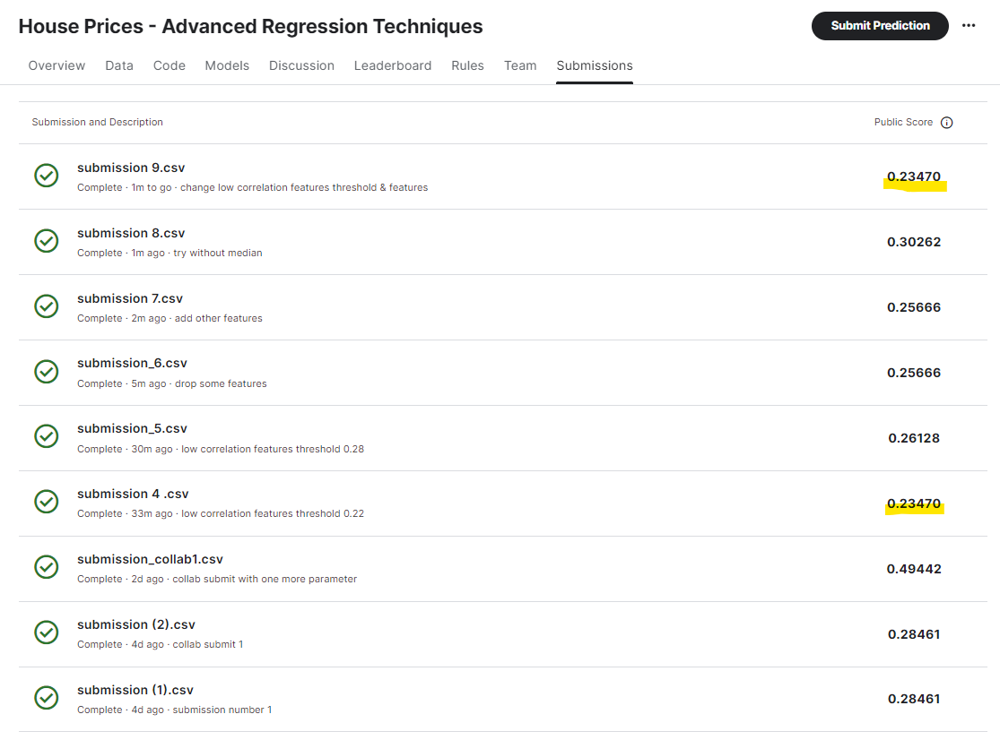

# Leaderboard #
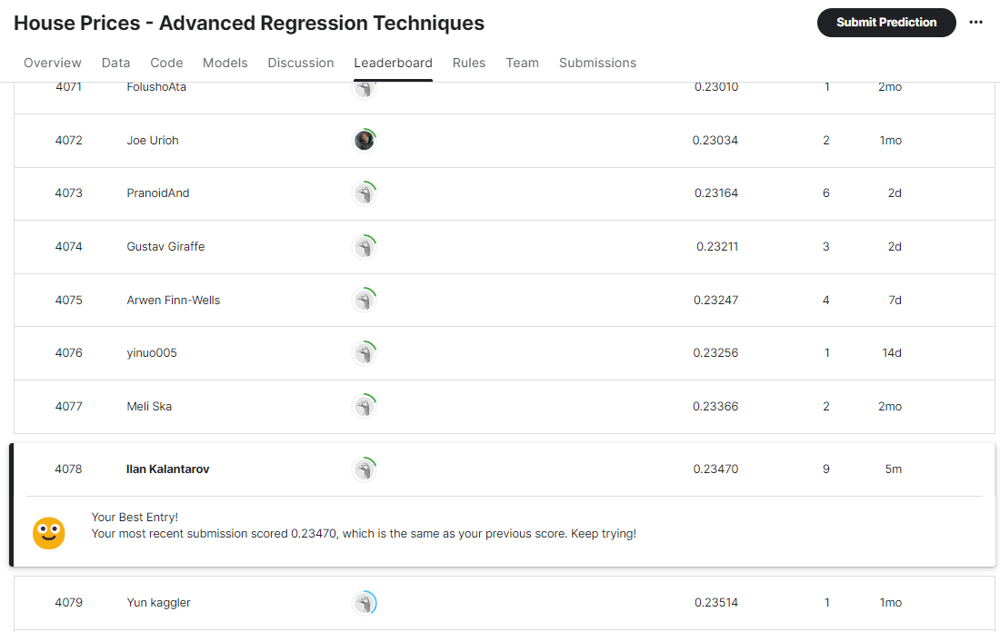

# To sum up
In this work, we investigated the dataset by checking for missing values and filling them using the mean or median of other values. We used Sweetviz and Autoviz to visualize the data, including graphs and feature correlations. Features with a correlation to the target feature less than 0.22 were dropped. We evaluated different models using cross-validation, experimenting with feature selection and regularization techniques. Ultimately, we chose the best model to make predictions on the test data.

# References

**Notebooks We were inspired by:**

https://www.kaggle.com/code/suvroo/wrapper-feature-selection-and-pca

https://www.kaggle.com/code/bsrsrc/house-prediction

https://github.com/JoannaBroniarek/House-Prices-Advanced-Regression-Techniques/blob/master/House_Prices.ipynb


**Web blog - Medium**

https://medium.com/@aknour/house-prices-advanced-regression-techniques-395fe629a0cd


**scikit-learn:**

https://scikit-learn.org/stable/
